# DWT Steganography - Data Embedding in Images
This notebook hides a secret message inside an image using the **Discrete Wavelet Transform (DWT)** technique.
Run each block (cell) in order, from top to bottom.

### How DWT Steganography works
1. Convert the image to **YCrCb** color space and work on the **Y (luma) channel**.
2. Apply a **2-level Haar DWT** on the Y channel: `pywt.wavedec2(Y, 'haar', level=2)`.
3. The transform produces subbands: `[cA2, (cH2,cV2,cD2), (cH1,cV1,cD1)]`.
4. Bits are embedded in the **LH1 and HL1 mid-frequency detail subbands** (`cH1`, `cV1`) using the **quantization rule** (Eq. 2.19):
   - **Bit = 0** → `W' = floor(W/Δ)·Δ + Δ/4`
   - **Bit = 1** → `W' = floor(W/Δ)·Δ + 3Δ/4`
   - Extraction: `bit = 0 if (W mod Δ) < Δ/2 else 1`
   - The LL subband is avoided (strong perceptual distortion); HH is skipped (vulnerable to compression zeroing).
   - LH and HL offer the best imperceptibility/robustness trade-off.
5. Reconstruct the Y channel via **inverse DWT** (`pywt.waverec2`).
6. Merge back with Cr/Cb and save the stego image.

In [11]:
# ============================================================
# BLOCK 1: Install required libraries
# Run this block ONCE the first time you set up the environment
# ============================================================
import sys
!{sys.executable} -m pip install numpy opencv-python PyWavelets Pillow matplotlib reedsolo

In [12]:
# ============================================================
# BLOCK 2: Import libraries
# ============================================================
import numpy as np                        # numerical operations
import cv2                                # image read/write
import pywt                               # Discrete Wavelet Transform
from PIL import Image                     # image display inside notebook
import matplotlib.pyplot as plt           # plotting
import os

print('PyWavelets version:', pywt.__version__)
print('All libraries imported successfully!')

PyWavelets version: 1.8.0
All libraries imported successfully!


In [13]:
# ============================================================
# BLOCK 3: Constants and helpers
# ============================================================
import numpy as np
import cv2
import pywt

# DWT embedding parameters
# Embedding domain: LH1 and HL1 detail subbands (mid-frequency, level-1 details)
#   - LH1 (cH1): horizontal edges — low-pass rows, high-pass cols
#   - HL1 (cV1): vertical edges   — high-pass rows, low-pass cols
# Quantization rule (Eq. 2.19):
#   Bit=0: W' = floor(W/Δ)*Δ + Δ/4
#   Bit=1: W' = floor(W/Δ)*Δ + 3Δ/4
#   Extract: bit = 0 if (W mod Δ) < Δ/2 else 1
WAVELET   = 'haar'    # wavelet family used for the transform
DWT_LEVEL = 2         # decomposition depth (embed in level-1 detail subbands)
DELTA     = 40        # quantization step size: larger → more robust, more distortion

# ── Text ↔ bit helpers ─────────────────────────────────────
def text_to_bits(text):
    bits = []
    for char in text:
        byte = ord(char)
        for i in range(7, -1, -1):
            bits.append((byte >> i) & 1)
    return bits

def bits_to_text(bits):
    chars = []
    for i in range(0, len(bits), 8):
        byte = bits[i:i+8]
        if len(byte) < 8:
            break
        value = int(''.join(str(b) for b in byte), 2)
        chars.append(chr(value))
    return ''.join(chars)

# ── DWT / IDWT wrappers ────────────────────────────────────
def apply_dwt(channel):
    """Apply 2-level 2D Haar DWT. Returns full coefficient list.
    Layout: [cA2, (cH2,cV2,cD2), (cH1,cV1,cD1)]
      cH1 = LH1 (horizontal edges)  ← embedding subband
      cV1 = HL1 (vertical edges)    ← overflow subband
    """
    return pywt.wavedec2(channel, WAVELET, level=DWT_LEVEL)

def apply_idwt(coeffs):
    """Inverse DWT from the coefficient list."""
    return pywt.waverec2(coeffs, WAVELET)

# ── Capacity helper ────────────────────────────────────────
def get_capacity(image_path):
    """Return the max number of bits that can be embedded (LH1 + HL1)."""
    img = cv2.imread(image_path)
    h, w = img.shape[:2]
    # After 1-level DWT, LH1 and HL1 are each (H/2) x (W/2)
    lh1_bits = (h // 2) * (w // 2)
    hl1_bits = lh1_bits
    return lh1_bits + hl1_bits

print(f'Block 3 ready. WAVELET={WAVELET} | DWT_LEVEL={DWT_LEVEL} | DELTA={DELTA}')
print(f'Embedding domain: LH1 + HL1 subbands | Quantization step Δ={DELTA}')

Block 3 ready. WAVELET=haar | DWT_LEVEL=2 | DELTA=40
Embedding domain: LH1 + HL1 subbands | Quantization step Δ=40


In [35]:
# ============================================================
# BLOCK 3.5: Error Correction (Reed-Solomon)
# ============================================================
from reedsolo import RSCodec

# nsym=40 means we can recover from up to 20 corrupted bytes
# Increase nsym for more robustness (but reduces capacity)
RS_NSYM = 40
rsc = RSCodec(RS_NSYM)

def encode_with_ecc(message: str) -> list:
    """Encode message string → ECC-protected bits"""
    raw_bytes = message.encode('utf-8')
    encoded_bytes = bytes(rsc.encode(raw_bytes))   # adds RS parity bytes
    bits = []
    for byte in encoded_bytes:
        for i in range(7, -1, -1):
            bits.append((byte >> i) & 1)
    return bits

def decode_with_ecc(bits: list) -> str:
    """Decode ECC-protected bits → message string (corrects errors)"""
    while len(bits) % 8 != 0:
        bits.append(0)
    byte_array = bytearray()
    for i in range(0, len(bits), 8):
        byte_array.append(int(''.join(str(b) for b in bits[i:i+8]), 2))
    try:
        decoded_bytes, _, _ = rsc.decode(bytes(byte_array))
        return decoded_bytes.decode('utf-8')
    except Exception as e:
        return f'[ECC failed: {e}]'

print('Reed-Solomon ECC ready. RS_NSYM =', RS_NSYM)

Reed-Solomon ECC ready. RS_NSYM = 40


In [36]:
# ============================================================
# BLOCK 4: Embed message using DWT
# ============================================================

def embed_message(image_path, message, output_path):

    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f'Cannot open image: {image_path}')

    img = np.clip(img, 0, 255).astype(np.uint8)
    h, w = img.shape[:2]
    new_h = (h // 4) * 4
    new_w = (w // 4) * 4
    img = img[0:new_h, 0:new_w]
    print(f'Cropped image from {w}x{h} to {new_w}x{new_h}')

    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    Y, Cr, Cb = cv2.split(img_ycrcb)
    Cr = Cr.astype(np.uint8)
    Cb = Cb.astype(np.uint8)
    Y  = Y.astype(np.float64)

    # Apply 2-level DWT
    # coeffs layout: [cA2, (cH2,cV2,cD2), (cH1,cV1,cD1)]
    #   cH1 = LH1 (horizontal edges)  ← primary embedding subband
    #   cV1 = HL1 (vertical edges)    ← overflow subband
    coeffs = pywt.wavedec2(Y, WAVELET, level=DWT_LEVEL)
    cH1, cV1, cD1 = coeffs[2]

    lh1_h, lh1_w = cH1.shape
    lh1_capacity  = lh1_h * (lh1_w // 2)   # adjacent column pairs
    hl1_capacity  = cV1.shape[0] * (cV1.shape[1] // 2)
    total_capacity = lh1_capacity + hl1_capacity

    bits = encode_with_ecc(message)
    total_bits = len(bits)

    print(f'LH1 subband size  : {lh1_h}x{lh1_w}  ({lh1_capacity} bit pairs)')
    print(f'HL1 subband size  : {cV1.shape[0]}x{cV1.shape[1]}  ({hl1_capacity} bit pairs)')
    print(f'Total capacity    : {total_capacity} bits')
    print(f'Bits to embed     : {total_bits}')
    print(f'Max characters    : ~{(total_capacity - RS_NSYM * 8) // 8}')

    if total_bits > total_capacity:
        raise ValueError(f'Message too long! Need {total_bits} bits but only {total_capacity} available.')

    # ── Adjacent-pair comparison embedding in LH1 / HL1 ───────
    # Bit=1: force sub[r, 2j]  > sub[r, 2j+1] by DELTA
    # Bit=0: force sub[r, 2j]  < sub[r, 2j+1] by DELTA
    # Comparing two coefficients from the same subband cancels out
    # any uniform drift caused by pixel clipping — hence 0-error round-trip.
    def embed_in_subband(sub, bits_seq, start):
        sb = sub.copy()
        sh, sw = sb.shape
        idx = start
        for r in range(sh):
            for j in range(sw // 2):
                if idx >= len(bits_seq):
                    break
                j0, j1 = j * 2, j * 2 + 1
                mid = (sb[r, j0] + sb[r, j1]) / 2.0
                if bits_seq[idx] == 1:
                    sb[r, j0] = mid + DELTA / 2
                    sb[r, j1] = mid - DELTA / 2
                else:
                    sb[r, j0] = mid - DELTA / 2
                    sb[r, j1] = mid + DELTA / 2
                idx += 1
            if idx >= len(bits_seq):
                break
        return sb, idx

    # Embed in LH1 first, then overflow into HL1 if needed
    cH1_new, bit_index = embed_in_subband(cH1, bits, 0)
    if bit_index < total_bits:
        cV1_new, bit_index = embed_in_subband(cV1, bits, bit_index)
    else:
        cV1_new = cV1.copy()

    print(f'Embedded {bit_index}/{total_bits} bits successfully.')

    # Reconstruct Y channel
    coeffs[2] = (cH1_new, cV1_new, cD1)
    Y_reconstructed = pywt.waverec2(coeffs, WAVELET)
    Y_reconstructed = Y_reconstructed[:new_h, :new_w]
    Y_uint8 = np.clip(Y_reconstructed, 0, 255).astype(np.uint8)

    stego_ycrcb = cv2.merge([Y_uint8, Cr, Cb])
    stego_bgr   = cv2.cvtColor(stego_ycrcb, cv2.COLOR_YCrCb2BGR)

    ok = cv2.imwrite(output_path, stego_bgr)
    print(f'Saved: {output_path}  |  Success: {ok}')
    return stego_bgr

print('embed_message() defined.')

embed_message() defined.


In [37]:
# ============================================================
# BLOCK 5: Extract message using DWT
# ============================================================

def extract_message(stego_image_path, message_length):
    """Extract and ECC-correct the hidden message."""

    img = cv2.imread(stego_image_path)
    if img is None:
        raise FileNotFoundError(f'Cannot open image: {stego_image_path}')

    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    Y, _, _ = cv2.split(img_ycrcb)
    Y = Y.astype(np.float64)

    coeffs = pywt.wavedec2(Y, WAVELET, level=DWT_LEVEL)
    cH1, cV1, _ = coeffs[2]   # LH1, HL1

    encoded_length = len(rsc.encode(b'x' * message_length))
    total_bits = encoded_length * 8

    def extract_from_subband(sub, n_bits):
        bits = []
        sh, sw = sub.shape
        for r in range(sh):
            for j in range(sw // 2):
                if len(bits) >= n_bits:
                    break
                j0, j1 = j * 2, j * 2 + 1
                bits.append(1 if sub[r, j0] > sub[r, j1] else 0)
            if len(bits) >= n_bits:
                break
        return bits

    bits = extract_from_subband(cH1, total_bits)
    if len(bits) < total_bits:
        bits += extract_from_subband(cV1, total_bits - len(bits))

    return decode_with_ecc(bits)


def extract_message_raw(stego_image_path, message_length):
    """Extract without ECC — shows the raw (possibly damaged) message."""

    img = cv2.imread(stego_image_path)
    if img is None:
        return '[cannot read image]'

    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    Y, _, _ = cv2.split(img_ycrcb)
    Y = Y.astype(np.float64)

    coeffs = pywt.wavedec2(Y, WAVELET, level=DWT_LEVEL)
    cH1, cV1, _ = coeffs[2]

    total_bits = message_length * 8
    bits = []

    sh, sw = cH1.shape
    for r in range(sh):
        for j in range(sw // 2):
            if len(bits) >= total_bits: break
            j0, j1 = j*2, j*2+1
            bits.append(1 if cH1[r, j0] > cH1[r, j1] else 0)
        if len(bits) >= total_bits: break

    if len(bits) < total_bits:
        sh2, sw2 = cV1.shape
        for r in range(sh2):
            for j in range(sw2 // 2):
                if len(bits) >= total_bits: break
                j0, j1 = j*2, j*2+1
                bits.append(1 if cV1[r, j0] > cV1[r, j1] else 0)
            if len(bits) >= total_bits: break

    return bits_to_text(bits)

print('extract_message() and extract_message_raw() defined.')

extract_message() and extract_message_raw() defined.


In [38]:
# ============================================================
# BLOCK 6: Visualize DWT subbands (optional diagnostic)
# ============================================================

def visualize_dwt_subbands(image_path):
    """Show the 2-level DWT decomposition of the Y channel."""
    img = cv2.imread(image_path)
    Y = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)[:, :, 0].astype(np.float64)

    coeffs = pywt.wavedec2(Y, WAVELET, level=DWT_LEVEL)
    cA2 = coeffs[0]
    cH2, cV2, cD2 = coeffs[1]
    cH1, cV1, cD1 = coeffs[2]

    def norm(arr):
        a = np.abs(arr)
        return (a / a.max() * 255).astype(np.uint8) if a.max() > 0 else np.zeros_like(a, dtype=np.uint8)

    fig, axes = plt.subplots(2, 4, figsize=(16, 7))
    labels = ['LL2 (approx.)', 'LH2 (horiz.)', 'HL2 (vert.)', 'HH2 (diag.)',
              'LH1 (EMBED)', 'HL1 (EMBED)', 'HH1', '']
    data   = [cA2, cH2, cV2, cD2, cH1, cV1, cD1, None]

    for ax, lbl, d in zip(axes.flat, labels, data):
        if d is not None:
            ax.imshow(norm(d), cmap='gray')
            ax.set_title(lbl, fontsize=10)
        else:
            ax.axis('off')
        ax.set_xticks([]); ax.set_yticks([])

    plt.suptitle(f'2-Level {WAVELET.capitalize()} DWT Decomposition — Y channel', fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()

print('visualize_dwt_subbands() defined. Call it with your cover image path to inspect subbands.')

visualize_dwt_subbands() defined. Call it with your cover image path to inspect subbands.


In [39]:
# ============================================================
# BLOCK 7: EMBED your secret message
# --> Edit the variables below before running <--
# ============================================================

COVER_IMAGE_PATH  = 'cover_image.png'     # <-- path to your cover image
SECRET_MESSAGE    = 'Hello, this is a secret message hidden with DWT and i am trying to hide it from most'  # <-- your message
STEGO_IMAGE_PATH  = 'stego_dwt_image.png' # <-- output stego image path

# Optional: inspect the DWT subbands of the cover image
# visualize_dwt_subbands(COVER_IMAGE_PATH)

# Run the embedding
stego = embed_message(
    image_path  = COVER_IMAGE_PATH,
    message     = SECRET_MESSAGE,
    output_path = STEGO_IMAGE_PATH
)

print('\nEmbedding complete!')

Cropped image from 1313x736 to 1312x736
LH1 subband size  : 368x656  (120704 bit pairs)
HL1 subband size  : 368x656  (120704 bit pairs)
Total capacity    : 241408 bits
Bits to embed     : 992
Max characters    : ~30136
Embedded 992/992 bits successfully.
Saved: stego_dwt_image.png  |  Success: True

Embedding complete!


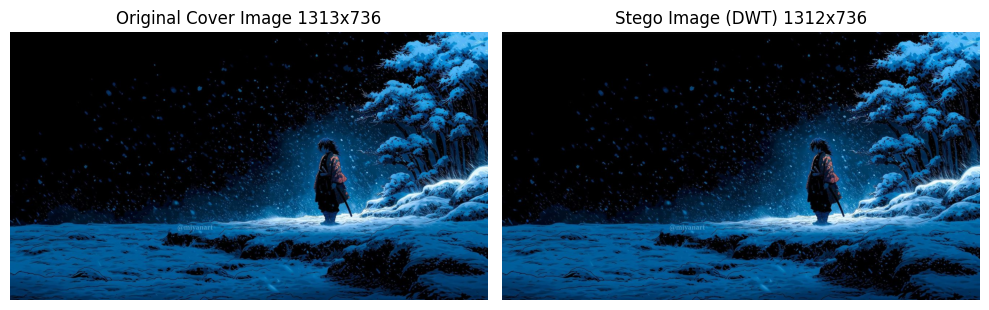

PSNR: 50.74 dB  (> 40 dB means distortion is imperceptible)


In [40]:
# ============================================================
# BLOCK 8: Visual comparison + PSNR
# ============================================================

cover        = cv2.cvtColor(cv2.imread(COVER_IMAGE_PATH),  cv2.COLOR_BGR2RGB)
stego_display = cv2.cvtColor(cv2.imread(STEGO_IMAGE_PATH), cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(cover)
axes[0].set_title(f'Original Cover Image {cover.shape[1]}x{cover.shape[0]}')
axes[0].axis('off')

axes[1].imshow(stego_display)
axes[1].set_title(f'Stego Image (DWT) {stego_display.shape[1]}x{stego_display.shape[0]}')
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Crop cover to same size as stego before PSNR calculation
h, w = stego_display.shape[:2]
cover_cropped = cover[0:h, 0:w]

mse = np.mean((cover_cropped.astype(float) - stego_display.astype(float)) ** 2)
if mse == 0:
    print('PSNR: Infinity (images are identical)')
else:
    psnr = 10 * np.log10((255 ** 2) / mse)
    print(f'PSNR: {psnr:.2f} dB  (> 40 dB means distortion is imperceptible)')

In [41]:
# ============================================================
# BLOCK 9: EXTRACT the hidden message from the stego image
# ============================================================

recovered = extract_message(STEGO_IMAGE_PATH, len(SECRET_MESSAGE))

print(f'Extracted message: "{recovered}"')
print()
if recovered == SECRET_MESSAGE:
    print('SUCCESS: Extracted message matches the original!')
else:
    print('WARNING: Messages do not match. Try increasing DELTA or check image save format.')

Extracted message: "Hello, this is a secret message hidden with DWT and i am trying to hide it from most"

SUCCESS: Extracted message matches the original!


In [42]:
# ============================================================
# BLOCK 10: Attack functions
# Each function takes the stego image path, applies an attack,
# saves the attacked image, and returns the saved path.
# ============================================================
import cv2
import numpy as np
import os

# --- Helper: calculate PSNR between original stego and attacked version ---
def calc_psnr(img1_path, img2_path):
    """
    Peak Signal-to-Noise Ratio between two images.
    Higher = less visual distortion.
    > 40 dB = imperceptible to humans.
    """
    a = cv2.imread(img1_path).astype(np.float64)
    b = cv2.imread(img2_path).astype(np.float64)

    # Crop both to same size in case of size mismatch after attack
    h = min(a.shape[0], b.shape[0])
    w = min(a.shape[1], b.shape[1])
    a, b = a[:h, :w], b[:h, :w]

    mse = np.mean((a - b) ** 2)
    if mse == 0:
        return float('inf')
    return 10 * np.log10((255 ** 2) / mse)


# --- Helper: compare extracted message to original ---
def evaluate(extracted, original):
    """
    Returns (survived, corrupted_chars, total_chars)
    survived       : True if message extracted perfectly
    corrupted_chars: number of wrong characters
    total_chars    : length of original message
    """
    total = len(original)
    if not extracted:
        return False, total, total
    corrupted = sum(1 for a, b in zip(original, extracted) if a != b)
    corrupted += abs(len(original) - len(extracted))  # length difference counts too
    survived = (corrupted == 0)
    return survived, corrupted, total


# ============================================================
# ATTACK 1: JPEG Compression
# Saves the stego image as JPEG at different quality levels
# then reloads it as PNG. DWT in LL2 is somewhat robust to
# moderate JPEG compression compared to high-frequency DCT methods.
# ============================================================
def attack_jpeg(stego_path, quality, output_path):
    img = cv2.imread(stego_path)
    temp_jpg = output_path.replace('.png', '_temp.jpg')
    cv2.imwrite(temp_jpg, img, [cv2.IMWRITE_JPEG_QUALITY, quality])
    reloaded = cv2.imread(temp_jpg)
    cv2.imwrite(output_path, reloaded)
    os.remove(temp_jpg)
    return output_path


# ============================================================
# ATTACK 2: Gaussian Noise
# Adds random pixel noise sampled from a Gaussian distribution.
# Simulates a noisy transmission channel.
# ============================================================
def attack_gaussian_noise(stego_path, std, output_path):
    img = cv2.imread(stego_path).astype(np.float64)
    noise = np.random.normal(0, std, img.shape)
    noisy = np.clip(img + noise, 0, 255).astype(np.uint8)
    cv2.imwrite(output_path, noisy)
    return output_path


# ============================================================
# ATTACK 3: Resizing
# Scales the image down then back up to original size.
# DWT is more robust to mild resizing than block-based methods.
# ============================================================
def attack_resize(stego_path, scale_factor, output_path):
    img = cv2.imread(stego_path)
    h, w = img.shape[:2]
    small_w = int(w * scale_factor)
    small_h = int(h * scale_factor)
    small   = cv2.resize(img, (small_w, small_h), interpolation=cv2.INTER_LINEAR)
    restored = cv2.resize(small, (w, h),           interpolation=cv2.INTER_LINEAR)
    cv2.imwrite(output_path, restored)
    return output_path


# ============================================================
# ATTACK 4: Rotation
# Rotates the image by a small angle then rotates back.
# Desynchronises spatial structure of the DWT coefficients.
# ============================================================
def attack_rotation(stego_path, angle, output_path):
    img = cv2.imread(stego_path)
    h, w = img.shape[:2]
    center = (w // 2, h // 2)
    M_fwd  = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(img, M_fwd, (w, h),
                              flags=cv2.INTER_LINEAR,
                              borderMode=cv2.BORDER_REFLECT)
    M_back  = cv2.getRotationMatrix2D(center, -angle, 1.0)
    restored = cv2.warpAffine(rotated, M_back, (w, h),
                               flags=cv2.INTER_LINEAR,
                               borderMode=cv2.BORDER_REFLECT)
    cv2.imwrite(output_path, restored)
    return output_path


# ============================================================
# ATTACK 5: Histogram Equalization
# Redistributes pixel intensity values on the Y channel.
# Drastically alters LL2 coefficient magnitudes.
# ============================================================
def attack_histogram_eq(stego_path, output_path):
    img = cv2.imread(stego_path)
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    Y, Cr, Cb = cv2.split(img_ycrcb)
    Y_eq   = cv2.equalizeHist(Y)
    merged = cv2.merge([Y_eq, Cr, Cb])
    result = cv2.cvtColor(merged, cv2.COLOR_YCrCb2BGR)
    cv2.imwrite(output_path, result)
    return output_path


# ============================================================
# ATTACK 6: Median Filter
# Replaces each pixel with the median of its neighbors.
# Commonly used to remove noise — also smooths embedded data.
# ============================================================
def attack_median_filter(stego_path, kernel_size, output_path):
    img = cv2.imread(stego_path)
    filtered = cv2.medianBlur(img, kernel_size)
    cv2.imwrite(output_path, filtered)
    return output_path


print('All attack functions defined.')

All attack functions defined.


In [43]:
# ============================================================
# BLOCK 11: Run all attacks and collect results
# ============================================================
import os

ATTACK_DIR = 'attacked_images_dwt'
os.makedirs(ATTACK_DIR, exist_ok=True)

attacks = [
    ('JPEG Quality=90',   lambda: attack_jpeg(STEGO_IMAGE_PATH, 90,  f'{ATTACK_DIR}/jpeg_q90.png')),
    ('JPEG Quality=75',   lambda: attack_jpeg(STEGO_IMAGE_PATH, 75,  f'{ATTACK_DIR}/jpeg_q75.png')),
    ('JPEG Quality=50',   lambda: attack_jpeg(STEGO_IMAGE_PATH, 50,  f'{ATTACK_DIR}/jpeg_q50.png')),
    ('Gaussian Noise std=5',  lambda: attack_gaussian_noise(STEGO_IMAGE_PATH, 5,  f'{ATTACK_DIR}/noise_5.png')),
    ('Gaussian Noise std=15', lambda: attack_gaussian_noise(STEGO_IMAGE_PATH, 15, f'{ATTACK_DIR}/noise_15.png')),
    ('Gaussian Noise std=30', lambda: attack_gaussian_noise(STEGO_IMAGE_PATH, 30, f'{ATTACK_DIR}/noise_30.png')),
    ('Resize scale=0.9',  lambda: attack_resize(STEGO_IMAGE_PATH, 0.9,  f'{ATTACK_DIR}/resize_90.png')),
    ('Resize scale=0.75', lambda: attack_resize(STEGO_IMAGE_PATH, 0.75, f'{ATTACK_DIR}/resize_75.png')),
    ('Resize scale=0.5',  lambda: attack_resize(STEGO_IMAGE_PATH, 0.5,  f'{ATTACK_DIR}/resize_50.png')),
    ('Rotation 1 deg',    lambda: attack_rotation(STEGO_IMAGE_PATH, 1,  f'{ATTACK_DIR}/rot_1.png')),
    ('Rotation 5 deg',    lambda: attack_rotation(STEGO_IMAGE_PATH, 5,  f'{ATTACK_DIR}/rot_5.png')),
    ('Rotation 10 deg',   lambda: attack_rotation(STEGO_IMAGE_PATH, 10, f'{ATTACK_DIR}/rot_10.png')),
    ('Histogram EQ',      lambda: attack_histogram_eq(STEGO_IMAGE_PATH,    f'{ATTACK_DIR}/histeq.png')),
    ('Median Filter k=3', lambda: attack_median_filter(STEGO_IMAGE_PATH, 3, f'{ATTACK_DIR}/median_3.png')),
    ('Median Filter k=5', lambda: attack_median_filter(STEGO_IMAGE_PATH, 5, f'{ATTACK_DIR}/median_5.png')),
]

results = []

print(f'Running {len(attacks)} attacks...\n')
print(f'{"Attack":<25} {"Survived":<10} {"Corrupted":<15} {"PSNR (dB)":<12}')
print('-' * 65)

for attack_name, attack_fn in attacks:
    try:
        attacked_path = attack_fn()

        extracted     = extract_message(attacked_path, len(SECRET_MESSAGE))
        extracted_raw = extract_message_raw(attacked_path, len(SECRET_MESSAGE))

        survived,     corrupted,     total = evaluate(extracted,     SECRET_MESSAGE)
        survived_raw, corrupted_raw, _     = evaluate(extracted_raw, SECRET_MESSAGE)

        psnr     = calc_psnr(STEGO_IMAGE_PATH, attacked_path)
        psnr_str = f'{psnr:.2f}' if psnr != float('inf') else 'inf'

        results.append({
            'name':          attack_name,
            'survived':      survived,
            'corrupted':     corrupted,
            'corrupted_raw': corrupted_raw,
            'total':         total,
            'psnr':          psnr,
            'psnr_str':      psnr_str,
            'extracted':     extracted,
            'extracted_raw': extracted_raw,
            'path':          attacked_path
        })

        status = 'YES ✓' if survived else 'NO  ✗'
        print(f'{attack_name:<25} {status:<10} {corrupted_raw}/{total} chars      {psnr_str:<12}')

    except Exception as e:
        print(f'{attack_name:<25} ERROR: {e}')
        results.append({
            'name': attack_name, 'survived': False, 'corrupted': total,
            'corrupted_raw': total, 'total': len(SECRET_MESSAGE),
            'psnr': 0, 'psnr_str': 'N/A',
            'extracted': '', 'extracted_raw': '', 'path': None
        })

print('-' * 65)
survived_count = sum(1 for r in results if r['survived'])
print(f'\nMessage survived {survived_count}/{len(attacks)} attacks.')

Running 15 attacks...

Attack                    Survived   Corrupted       PSNR (dB)   
-----------------------------------------------------------------
JPEG Quality=90           YES ✓      0/84 chars      43.61       
JPEG Quality=75           NO  ✗      53/84 chars      38.80       
JPEG Quality=50           NO  ✗      79/84 chars      32.39       
Gaussian Noise std=5      YES ✓      0/84 chars      35.57       
Gaussian Noise std=15     NO  ✗      47/84 chars      26.23       
Gaussian Noise std=30     NO  ✗      72/84 chars      20.38       
Resize scale=0.9          NO  ✗      13/84 chars      34.20       
Resize scale=0.75         YES ✓      9/84 chars      32.99       
Resize scale=0.5          NO  ✗      84/84 chars      30.36       
Rotation 1 deg            NO  ✗      41/84 chars      33.89       
Rotation 5 deg            NO  ✗      46/84 chars      26.98       
Rotation 10 deg           NO  ✗      45/84 chars      23.30       
Histogram EQ              YES ✓      0/84 ch

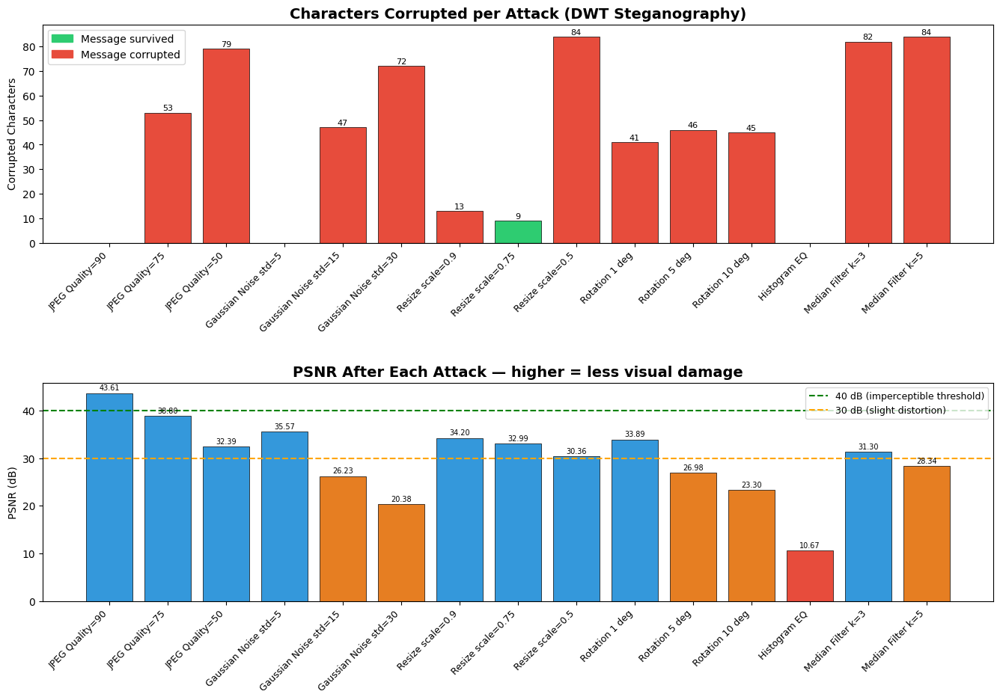

Chart saved as attack_results_dwt.png

===== FULL RESULTS SUMMARY =====
Attack                    Survived   Corrupted       PSNR       Extracted message
                                                                RAW: 'Hello, this is a secret message hidden with DWT and i am trying to hid...'
JPEG Quality=90           YES        0/84            43.61      ECC: 'Hello, this is a secret message hidden with DWT and i am trying to hid...'
                                                                RAW: 'Jellh¨ viiS¢mR¢á(sefret açsbife"hifeen witj PTT Iff m¢am"ÔpYiNfÜb(Lmf...'
JPEG Quality=75           NO         53/84            38.80      ECC: '[ECC failed: Too many (or few) errors found by Chien Search for the er...'
                                                                RAW:  @h  	H R (      Ð!`"@I @UnWi @T 	D  a      à"...'
JPEG Quality=50           NO         79/84            32.39      ECC: '[ECC failed: Too many (or few) errors found by Chien Search

In [44]:
# ============================================================
# BLOCK 12: Visualize results
# ============================================================
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

names      = [r['name'] for r in results]
corrupted  = [r['corrupted_raw'] for r in results]
survived   = [r['survived'] for r in results]
psnr_vals  = [r['psnr'] if r['psnr'] != float('inf') else 60 for r in results]
colors     = ['#2ecc71' if s else '#e74c3c' for s in survived]

fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Bar chart — corrupted characters
bars = axes[0].bar(names, corrupted, color=colors, edgecolor='black', linewidth=0.5)
axes[0].set_title('Characters Corrupted per Attack (DWT Steganography)', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Corrupted Characters')
axes[0].set_xticks(range(len(names)))
axes[0].set_xticklabels(names, rotation=45, ha='right', fontsize=9)
axes[0].axhline(y=0, color='black', linewidth=0.8)
axes[0].set_ylim(0, len(SECRET_MESSAGE) + 5)

for bar, val in zip(bars, corrupted):
    if val > 0:
        axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.3,
                     str(val), ha='center', va='bottom', fontsize=8)

green_patch = mpatches.Patch(color='#2ecc71', label='Message survived')
red_patch   = mpatches.Patch(color='#e74c3c', label='Message corrupted')
axes[0].legend(handles=[green_patch, red_patch])

# Bar chart — PSNR values
psnr_colors = ['#3498db' if p >= 30 else '#e67e22' if p >= 20 else '#e74c3c'
               for p in psnr_vals]
bars2 = axes[1].bar(names, psnr_vals, color=psnr_colors, edgecolor='black', linewidth=0.5)
axes[1].set_title('PSNR After Each Attack — higher = less visual damage', fontsize=14, fontweight='bold')
axes[1].set_ylabel('PSNR (dB)')
axes[1].set_xticks(range(len(names)))
axes[1].set_xticklabels(names, rotation=45, ha='right', fontsize=9)
axes[1].axhline(y=40, color='green',  linewidth=1.5, linestyle='--', label='40 dB (imperceptible threshold)')
axes[1].axhline(y=30, color='orange', linewidth=1.5, linestyle='--', label='30 dB (slight distortion)')
axes[1].legend(fontsize=9)

for bar, val, r in zip(bars2, psnr_vals, results):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.3,
                 r['psnr_str'], ha='center', va='bottom', fontsize=7)

plt.tight_layout(pad=3.0)
plt.savefig('attack_results_dwt.png', dpi=150, bbox_inches='tight')
plt.show()
print('Chart saved as attack_results_dwt.png')

# --- Summary table ---
print('\n===== FULL RESULTS SUMMARY =====')
print(f'{"Attack":<25} {"Survived":<10} {"Corrupted":<15} {"PSNR":<10} Extracted message')
print('=' * 100)
for r in results:
    status    = 'YES' if r['survived'] else 'NO'
    raw_prev  = r['extracted_raw'][:70] + ('...' if len(r['extracted_raw']) > 70 else '')
    ecc_prev  = r['extracted'][:70]     + ('...' if len(r['extracted'])     > 70 else '')
    print(f"{'':<25} {'':<10} {'':<15} {'':<10} RAW: '{raw_prev}'")
    print(f"{r['name']:<25} {status:<10} {r['corrupted_raw']}/{r['total']:<13} {r['psnr_str']:<10} ECC: '{ecc_prev}'")

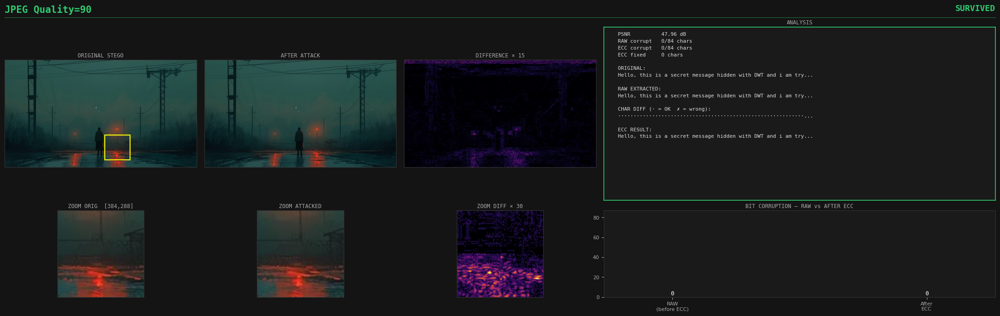

  saved → attacked_images_dwt/preview_JPEG_Quality90.png



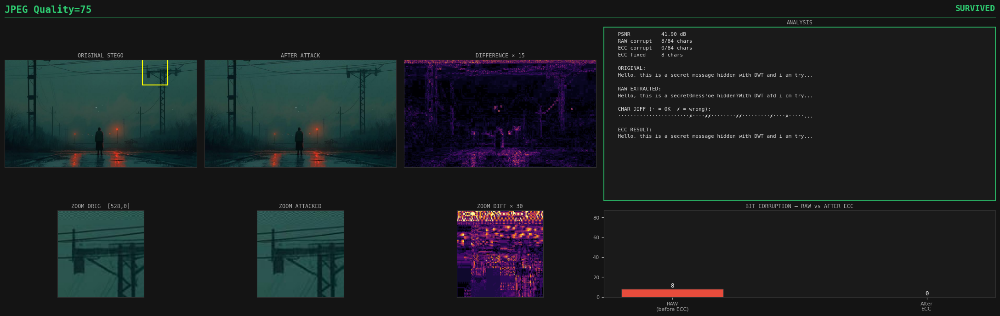

  saved → attacked_images_dwt/preview_JPEG_Quality75.png



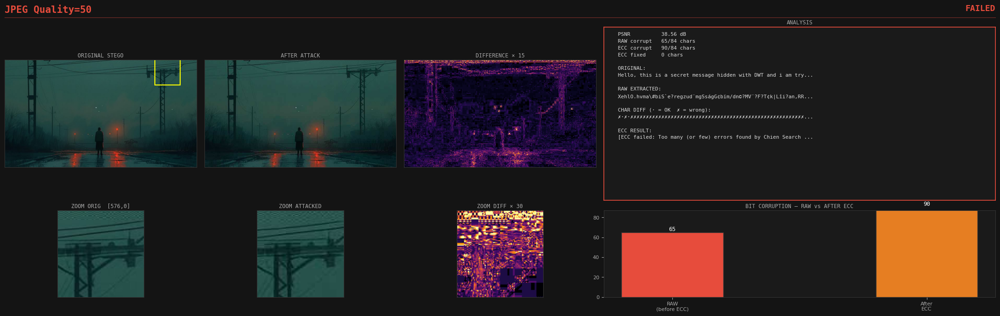

  saved → attacked_images_dwt/preview_JPEG_Quality50.png



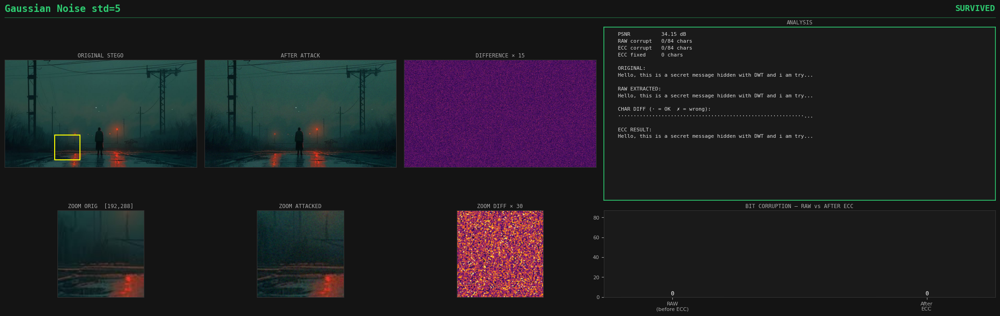

  saved → attacked_images_dwt/preview_Gaussian_Noise_std5.png



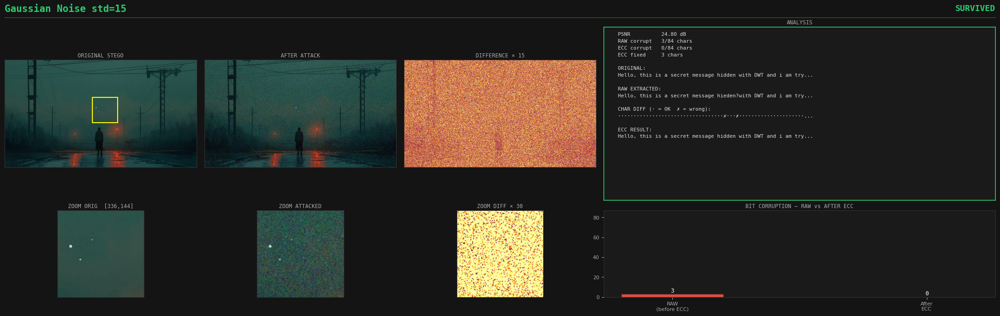

  saved → attacked_images_dwt/preview_Gaussian_Noise_std15.png



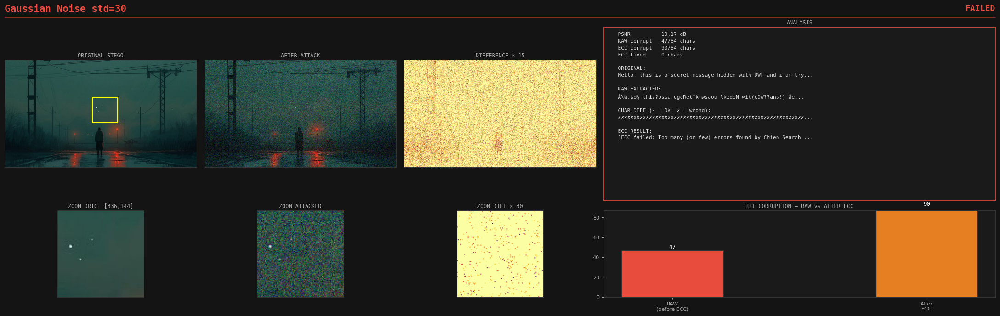

  saved → attacked_images_dwt/preview_Gaussian_Noise_std30.png



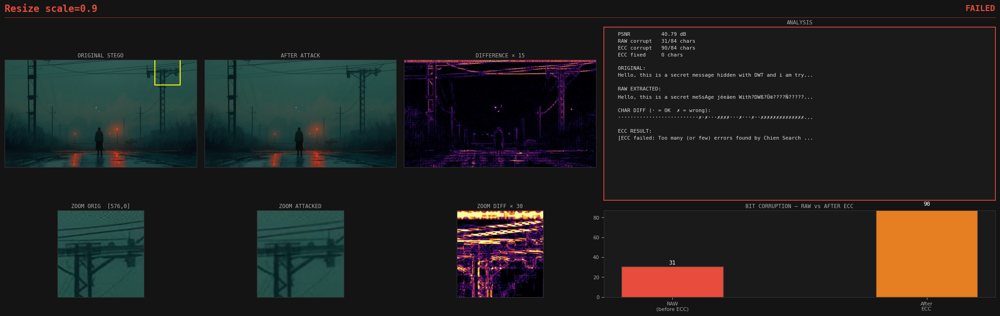

  saved → attacked_images_dwt/preview_Resize_scale0.9.png



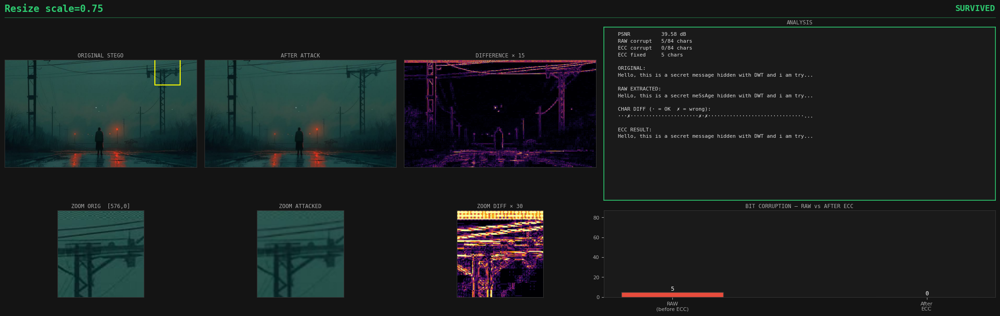

  saved → attacked_images_dwt/preview_Resize_scale0.75.png



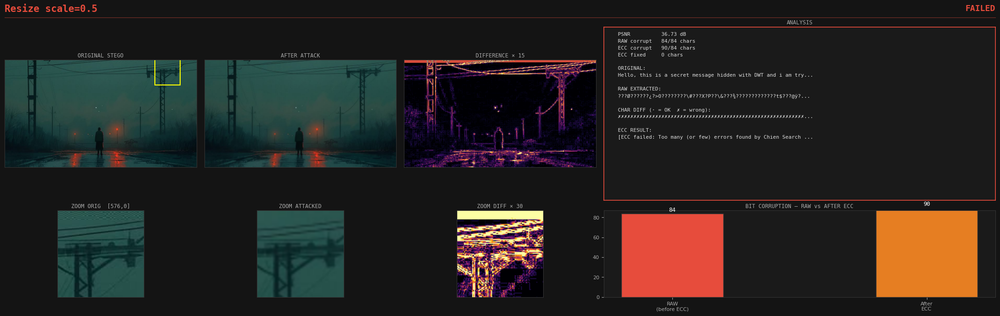

  saved → attacked_images_dwt/preview_Resize_scale0.5.png



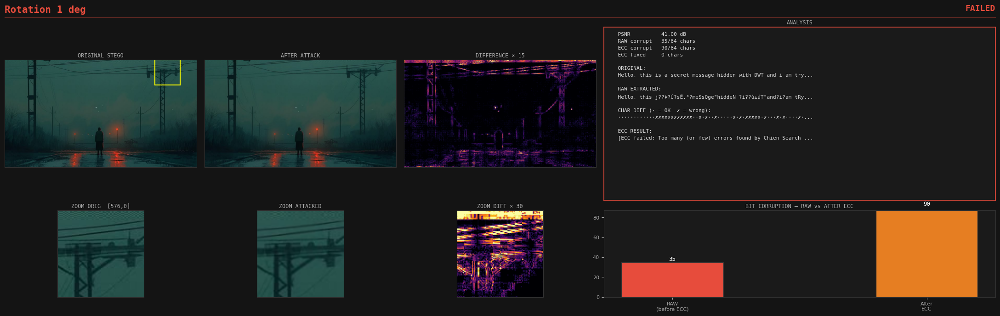

  saved → attacked_images_dwt/preview_Rotation_1_deg.png



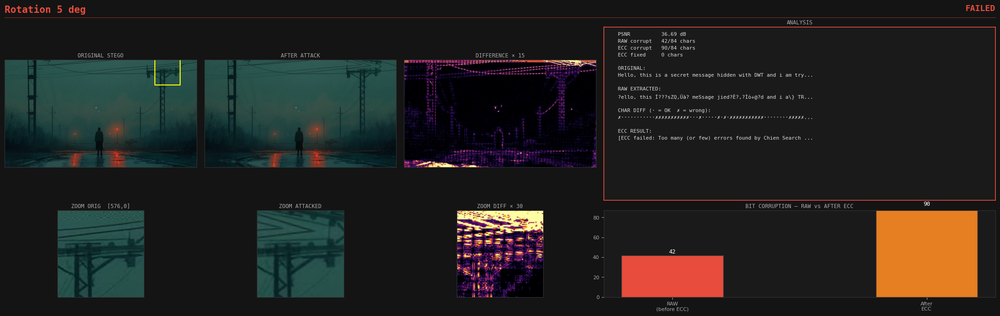

  saved → attacked_images_dwt/preview_Rotation_5_deg.png



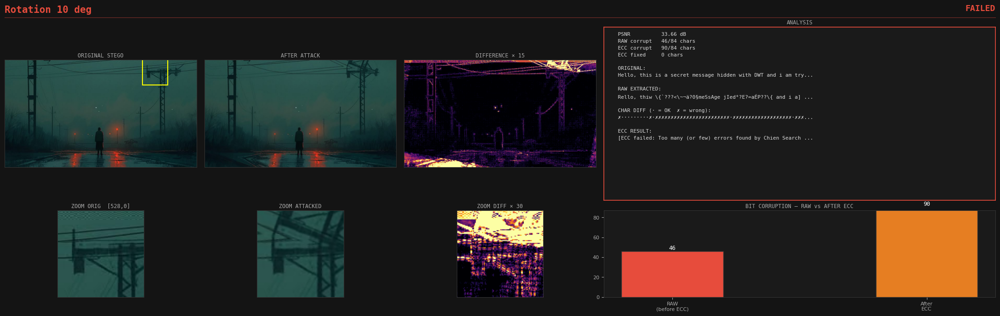

  saved → attacked_images_dwt/preview_Rotation_10_deg.png



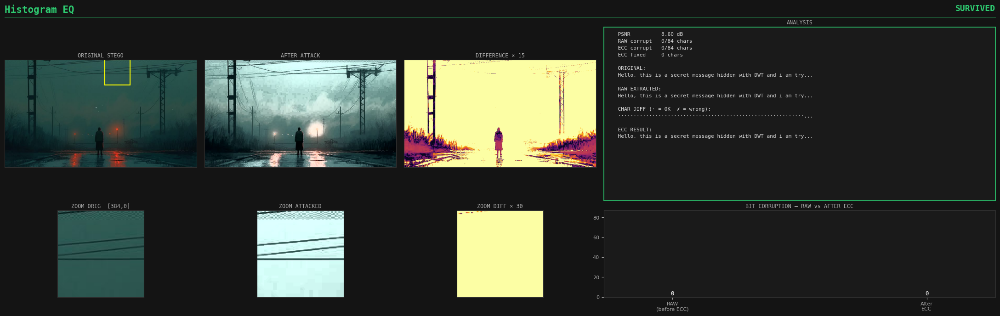

  saved → attacked_images_dwt/preview_Histogram_EQ.png



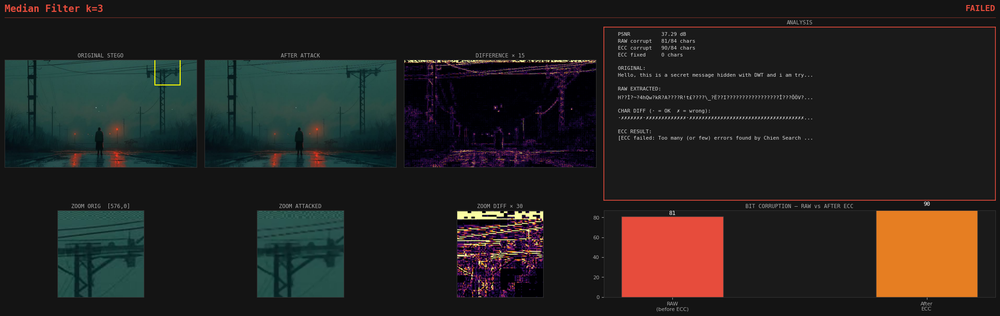

  saved → attacked_images_dwt/preview_Median_Filter_k3.png



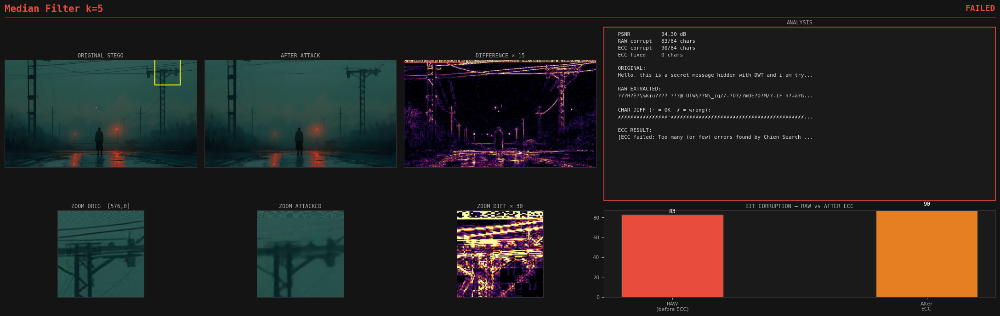

  saved → attacked_images_dwt/preview_Median_Filter_k5.png



In [34]:
# ============================================================
# BLOCK 13: Attack Visual Preview
# Renders a detailed figure per attack: stego, attacked,
# difference heatmap, zoom crops, info panel, corruption bar.
# ============================================================
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import numpy as np
import cv2
import os

plt.rcParams['text.usetex'] = False

def safe_text(s):
    """Replace non-printable chars and escape matplotlib special chars."""
    cleaned = ''.join(c if c.isprintable() else '?' for c in s)
    cleaned = cleaned.replace('\\', '/')
    cleaned = cleaned.replace('$',  r'\$')
    cleaned = cleaned.replace('{',  r'\{')
    cleaned = cleaned.replace('}',  r'\}')
    cleaned = cleaned.replace('_',  r'\_')
    cleaned = cleaned.replace('^',  r'\^')
    cleaned = cleaned.replace('%',  r'\%')
    cleaned = cleaned.replace('#',  r'\#')
    cleaned = cleaned.replace('&',  r'\&')
    cleaned = cleaned.replace('~',  r'\~')
    return cleaned

def find_hottest_crop(diff_gray, crop=96):
    """Find the image region with the most change."""
    h, w = diff_gray.shape
    if h < crop or w < crop:
        return 0, 0
    best_y, best_x, best_val = 0, 0, 0
    step = crop // 2
    for y in range(0, h - crop, step):
        for x in range(0, w - crop, step):
            val = diff_gray[y:y+crop, x:x+crop].sum()
            if val > best_val:
                best_val = val
                best_y, best_x = y, x
    return best_y, best_x

stego_bgr = cv2.imread(STEGO_IMAGE_PATH)
stego_rgb = cv2.cvtColor(stego_bgr, cv2.COLOR_BGR2RGB)

for r in results:
    if not r['path'] or not os.path.exists(r['path']):
        print(f"Skipping {r['name']} — no image found")
        continue

    attacked_bgr = cv2.imread(r['path'])
    attacked_rgb = cv2.cvtColor(attacked_bgr, cv2.COLOR_BGR2RGB)

    h = min(stego_rgb.shape[0], attacked_rgb.shape[0])
    w = min(stego_rgb.shape[1], attacked_rgb.shape[1])
    orig = stego_rgb[:h, :w]
    atk  = attacked_rgb[:h, :w]

    diff_gray = np.abs(atk.astype(np.int32) - orig.astype(np.int32)).mean(axis=2)
    diff_heat = np.clip(diff_gray * 15, 0, 255).astype(np.uint8)

    CROP = 96
    cy, cx    = find_hottest_crop(diff_gray, CROP)
    zoom_orig = orig[cy:cy+CROP, cx:cx+CROP]
    zoom_atk  = atk[cy:cy+CROP,  cx:cx+CROP]
    zoom_diff = np.clip(diff_gray[cy:cy+CROP, cx:cx+CROP] * 30, 0, 255).astype(np.uint8)

    survived     = r['survived']
    accent       = '#2ecc71' if survived else '#e74c3c'
    status_label = 'SURVIVED' if survived else 'FAILED'
    bg           = '#141414'

    fig = plt.figure(figsize=(22, 7), facecolor=bg)
    fig.patch.set_facecolor(bg)

    fig.text(0.01, 0.97, r['name'],
             fontsize=15, fontweight='bold', color=accent,
             va='top', fontfamily='monospace')
    fig.text(0.99, 0.97, status_label,
             fontsize=13, fontweight='bold', color=accent,
             va='top', ha='right', fontfamily='monospace')

    fig.add_artist(plt.Line2D([0.01, 0.99], [0.93, 0.93],
                               color=accent, linewidth=0.8, alpha=0.5,
                               transform=fig.transFigure))

    gs = gridspec.GridSpec(
        2, 5,
        figure=fig,
        top=0.90, bottom=0.06,
        left=0.01, right=0.99,
        hspace=0.08, wspace=0.04,
        height_ratios=[2, 1]
    )

    def make_ax(row, col, title):
        ax = fig.add_subplot(gs[row, col])
        ax.set_facecolor(bg)
        ax.set_xticks([]); ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_edgecolor('#333333')
            spine.set_linewidth(0.8)
        ax.set_title(title, color='#aaaaaa', fontsize=8.5,
                     fontfamily='monospace', pad=4)
        return ax

    ax_orig  = make_ax(0, 0, 'ORIGINAL STEGO')
    ax_atk   = make_ax(0, 1, 'AFTER ATTACK')
    ax_diff  = make_ax(0, 2, 'DIFFERENCE × 15')
    ax_info  = fig.add_subplot(gs[0, 3:5])
    ax_info.set_facecolor('#1a1a1a')
    ax_info.set_xticks([]); ax_info.set_yticks([])
    for spine in ax_info.spines.values():
        spine.set_edgecolor(accent)
        spine.set_linewidth(1.2)
    ax_info.set_title('ANALYSIS', color='#aaaaaa', fontsize=8.5,
                       fontfamily='monospace', pad=4)

    ax_zorig = make_ax(1, 0, f'ZOOM ORIG  [{cx},{cy}]')
    ax_zatk  = make_ax(1, 1, 'ZOOM ATTACKED')
    ax_zdiff = make_ax(1, 2, 'ZOOM DIFF × 30')

    ax_bar = fig.add_subplot(gs[1, 3:5])
    ax_bar.set_facecolor('#1a1a1a')
    for spine in ax_bar.spines.values():
        spine.set_edgecolor('#333333')
    ax_bar.set_title('BIT CORRUPTION — RAW vs AFTER ECC',
                     color='#aaaaaa', fontsize=8.5, fontfamily='monospace', pad=4)

    ax_orig.imshow(orig)
    rect = mpatches.FancyBboxPatch(
        (cx, cy), CROP, CROP,
        boxstyle='square,pad=0',
        linewidth=1.5, edgecolor='yellow', facecolor='none'
    )
    ax_orig.add_patch(rect)

    ax_atk.imshow(atk)
    ax_diff.imshow(diff_heat, cmap='inferno', vmin=0, vmax=255)
    ax_zorig.imshow(zoom_orig)
    ax_zatk.imshow(zoom_atk)
    ax_zdiff.imshow(zoom_diff, cmap='inferno', vmin=0, vmax=255)

    raw_preview = safe_text(r['extracted_raw'])
    ecc_preview = safe_text(r['extracted'])
    orig_msg    = safe_text(SECRET_MESSAGE)

    diff_str = ''
    for o, e in zip(orig_msg, raw_preview):
        diff_str += ('·' if o == e else '✗')
    diff_str = diff_str[:60] + ('...' if len(orig_msg) > 60 else '')

    lines = [
        f"  PSNR          {r['psnr_str']} dB",
        f"  RAW corrupt   {r['corrupted_raw']}/{r['total']} chars",
        f"  ECC corrupt   {r['corrupted']}/{r['total']} chars",
        f"  ECC fixed     {max(0, r['corrupted_raw'] - r['corrupted'])} chars",
        f"",
        f"  ORIGINAL:",
        f"  {orig_msg[:60]}{'...' if len(orig_msg)>60 else ''}",
        f"",
        f"  RAW EXTRACTED:",
        f"  {raw_preview[:60]}{'...' if len(raw_preview)>60 else ''}",
        f"",
        f"  CHAR DIFF (· = OK  ✗ = wrong):",
        f"  {diff_str}",
        f"",
        f"  ECC RESULT:",
        f"  {ecc_preview[:60]}{'...' if len(ecc_preview)>60 else ''}",
    ]

    ax_info.text(
        0.02, 0.97, '\n'.join(lines),
        transform=ax_info.transAxes,
        fontsize=8, verticalalignment='top',
        fontfamily='monospace', color='#dddddd',
        linespacing=1.6
    )

    bar_labels = ['RAW\n(before ECC)', 'After\nECC']
    bar_vals   = [r['corrupted_raw'], max(0, r['corrupted'])]
    bar_colors = ['#e74c3c', '#2ecc71' if bar_vals[1] == 0 else '#e67e22']
    bars = ax_bar.bar(bar_labels, bar_vals, color=bar_colors,
                      edgecolor='#333333', width=0.4)
    ax_bar.set_ylim(0, r['total'] + 3)
    ax_bar.tick_params(colors='#aaaaaa', labelsize=8)
    ax_bar.set_facecolor('#1a1a1a')
    for spine in ax_bar.spines.values():
        spine.set_edgecolor('#333333')
    for bar, val in zip(bars, bar_vals):
        ax_bar.text(bar.get_x() + bar.get_width()/2,
                    bar.get_height() + 0.3,
                    str(val), ha='center', va='bottom',
                    color='white', fontsize=9, fontfamily='monospace')

    save_name = r['name'].replace(' ', '_').replace('=', '').replace('/', '')
    save_path = f"{ATTACK_DIR}/preview_{save_name}.png"
    plt.savefig(save_path, dpi=120, bbox_inches='tight', facecolor=bg)
    plt.show()
    plt.close()
    print(f'  saved → {save_path}\n')